In [ ]:
import sagemaker

sagemaker_session = sagemaker.Session()

bucket = sagemaker_session.default_bucket()
prefix = 'sagemaker/522'

role = sagemaker.get_execution_role()

In [ ]:
!pip install nilearn
!pip install torch
!pip install torchvision
!pip install tqdm

In [ ]:
import numpy as np
import tqdm
import os
import nibabel as nib
import pandas as pd
import nilearn
import os
import datetime
import torch
import random
from skimage import exposure
from matplotlib import pyplot as plt
device = ('cuda:0' if torch.cuda.is_available() else 'cpu')

In [ ]:
# !unzip native_2.zip
# !unzip native_1.zip

In [ ]:
nib_images = []
nib_lesions = []

In [ ]:
for subdir in os.listdir('native_1'):
    if subdir != '.DS_Store':
        look = 'native_1' + '/' + subdir
        for subsubdir in os.listdir(look):
            if subsubdir != '.DS_Store':
                sublook = look + '/' + subsubdir
                nib_images.append(nib.load(sublook + '/' + subsubdir +'.nii.gz'))
                nib_lesions.append(nib.load(sublook + '/' + subsubdir + '_LesionSmooth.nii.gz'))

In [ ]:
for subdir in os.listdir('native_2'):
    if subdir != '.DS_Store':
        look = 'native_2' + '/' + subdir
        for subsubdir in os.listdir(look):
            if subsubdir != '.DS_Store':
                sublook = look + '/' + subsubdir
                nib_images.append(nib.load(sublook + '/' + subsubdir +'.nii.gz'))
                nib_lesions.append(nib.load(sublook + '/' + subsubdir + '_LesionSmooth.nii.gz'))

In [39]:
metadata = pd.read_csv('metadata.csv')

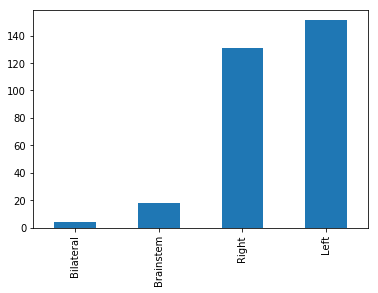

In [53]:
metadata['Primary Stroke Location Hemisphere'].value_counts().sort_values().plot(kind = 'bar')

In [9]:
d = [48, 56, 62, 64]

In [10]:
def get_3d_features_train(brain, lesion):
    s0, s1, s2 = brain.shape
    ran = 0.01
    features = []
    labels = []
    for k in range(s2 - 100):
        for i in range(s0 - 100):
            for j in range(s1 - 100):
                if lesion[i+50, j+50, k+50] != 0 or random.random() < ran:
                    features.append(brain[i+38:i+63, j+38:j+63, k+38:k+63])
                    labels.append(lesion[i+50, j+50, k+50])
    return features, labels

In [84]:
def get_3d_features_test(brain, lesion, rep):
    s0, s1, s2 = brain.shape
    ran = 0.0004 if rep else 1
    ran2 = 0.2 if rep else 1
    features = []
    labels = []
    for k in range(s2 - 100):
        for i in range(s0 - 100):
            for j in range(s1 - 100):
                l = lesion[i+50, j+50, k+50]
                if (random.random() < ran and l==0) or (random.random() < ran2 and l==1):
                    features.append(brain[i+38:i+63, j+38:j+63, k+38:k+63])
                    labels.append(lesion[i+50, j+50, k+50])
    return features, labels

In [61]:
max_size = (176, 196, 200)
def padding(brain, lesion):
    padded_brain = np.zeros(max_size)
    padded_lesion = np.zeros(max_size)
    s0, s1, s2 = brain.shape

    h = int(np.floor((max_size[0] - s0)/2))
    w = int(np.floor((max_size[1] - s1)/2))
    f = int(np.floor((max_size[2] - s2)/2))

    padded_brain[h:h+s0, w:w+s1, f:f+s2] = brain
    padded_lesion[h:h+s0, w:w+s1, f:f+s2] = lesion

    return padded_brain, padded_lesion

In [13]:
brain_data = []
lesion_data = []

for i in tqdm.tqdm(range(100)): 
    if i not in d and i not in [36,37]: # where brain sizes and lesion sizes are different
#         print(i)
        # img, lesion = preprocess(nib_images[0], nib_lesions[0])
        img, lesion = nib_images[i], nib_lesions[i]
        # normalize
        brain = img.get_fdata()/255
        lesion = lesion.get_fdata()/255
        #reshape for consistency
        if i < 31:
          brain = np.rot90(brain,1,axes=(0,2)).copy()
          lesion = np.rot90(lesion,1,axes=(0,2)).copy()
        elif i > 85:
          brain = np.swapaxes(brain,1,2).copy()
          brain = np.rot90(brain,1,axes=(0,2)).copy()
          lesion = np.swapaxes(lesion,1,2).copy()
          lesion = np.rot90(lesion,1,axes=(0,2)).copy()

        # get features
        if brain.shape[0:3] < (50, 50, 50):
            continue
        features, labels = get_3d_features_train(brain, lesion)
        brain_data.extend(features)
        lesion_data.extend(labels)


100%|██████████| 100/100 [01:31<00:00,  1.09it/s]


In [15]:
def show_slice(img,x):
    plt.figure()
    plt.imshow(img[:,x,:], cmap='gray')
    plt.show()

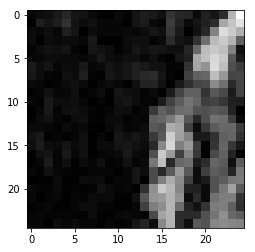

In [16]:
show_slice(brain_data[0],3)

In [92]:
brain_data_valid = []
lesion_data_valid = []

for i in tqdm.tqdm(range(100,125)): 
    if i not in d: # where brain sizes and lesion sizes are different
        img, lesion = nib_images[i], nib_lesions[i]
        # normalize
        brain = img.get_fdata()/255
        lesion = lesion.get_fdata()/255
        #reshape for consistency
        if i < 31:
          brain = np.rot90(brain,1,axes=(0,2)).copy()
          lesion = np.rot90(lesion,1,axes=(0,2)).copy()
        elif i > 85:
          brain = np.swapaxes(brain,1,2).copy()
          brain = np.rot90(brain,1,axes=(0,2)).copy()
          lesion = np.swapaxes(lesion,1,2).copy()
          lesion = np.rot90(lesion,1,axes=(0,2)).copy()
        #histogram equalize

        # get features
        if brain.shape[0:3] < (50, 50, 50):
            continue
        features, labels = get_3d_features_test(brain, lesion, False)
        brain_data_valid.extend(features)
        lesion_data_valid.extend(labels)

100%|██████████| 25/25 [01:21<00:00,  3.24s/it]


In [94]:
brain_data_test = []
lesion_data_test = []

for i in tqdm.tqdm(range(125,150)): 
    if i not in d: # where brain sizes and lesion sizes are different
        # img, lesion = preprocess(nib_images[0], nib_lesions[0])
        img, lesion = nib_images[i], nib_lesions[i]
        # normalize
        brain = img.get_fdata()/255
        lesion = lesion.get_fdata()/255
        #reshape for consistency
        if i < 31:
          brain = np.rot90(brain,1,axes=(0,2)).copy()
          lesion = np.rot90(lesion,1,axes=(0,2)).copy()
        elif i > 85:
          brain = np.swapaxes(brain,1,2).copy()
          brain = np.rot90(brain,1,axes=(0,2)).copy()
          lesion = np.swapaxes(lesion,1,2).copy()
          lesion = np.rot90(lesion,1,axes=(0,2)).copy()
        # get features
        if brain.shape[0:3] < (50, 50, 50):
            continue
        features, labels = get_3d_features_test(brain, lesion, False)
        brain_data_test.extend(features)
        lesion_data_test.extend(labels)

100%|██████████| 25/25 [01:18<00:00,  3.12s/it]


In [23]:
import torch.nn as nn
from torch import optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils, models

In [24]:
class BrainsDataset3D(Dataset):
    def __init__(self, brains, lesions, transform=None):
        self.brains = brains
        self.lesions = lesions
        self.transform = transform

    def __len__(self):
        return len(self.brains)

    def __getitem__(self, idx):
        brains = self.brains[idx].reshape(1, 25, 25, 25)
        sample = {'brain': brains, 'lesion': self.lesions[idx]}
        if self.transform:
            sample['brain'] = self.transform(sample['brain'][0]).unsqueeze(0)
        return sample

In [199]:
np.mean(brain_data)

3.161544154755083

In [200]:
np.std(brain_data)

4.81863903542213

In [25]:
input_transforms = transforms.Compose([transforms.ToTensor(),
            transforms.Normalize(mean=3.16,std=4.81)])
brains_dataset = BrainsDataset3D(brain_data, lesion_data, transform=input_transforms)
brains_valid = BrainsDataset3D(brain_data_valid, lesion_data_valid, transform=input_transforms)
brains_test = BrainsDataset3D(brain_data_test, lesion_data_test, transform=transforms.ToTensor())
dataloader = DataLoader(brains_dataset, batch_size=64, shuffle=True)
val_dataloader = DataLoader(brains_valid, batch_size = 256, shuffle=False)
test_dataloader = DataLoader(brains_test, batch_size = 2000, shuffle=False)

In [104]:
def dice(true, pred):
  true = np.array(true)
  pred = np.array(pred)
  intersection = np.sum(true*pred)
  union = np.sum(true == 1) + np.sum(pred == 1)
  print(intersection)
  return 2*intersection/union

In [28]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN,self).__init__()
        self.conv = nn.Sequential(nn.Conv3d(1,16,3,1,1),
                                 nn.MaxPool3d(2),
                                 nn.ReLU(),
                                 nn.Conv3d(16,32,3,1,1),
                                 nn.MaxPool3d(2),
                                 nn.ReLU(),
                                 nn.Conv3d(32,64,3,1,1),
                                 nn.MaxPool3d(2),
                                 nn.ReLU(),
                                 nn.Conv3d(64,32,3,1,1),
                                 nn.ReLU(),
                                 nn.Conv3d(32,16,3,1,1),
                                 nn.ReLU())
        self.lin = nn.Sequential(nn.Linear(432,64),
                                nn.ReLU(),
                                nn.Linear(64,2),
                                nn.Softmax(0))
        
    def forward(self,brain):
        out = self.conv(brain)
#         print(out.shape)
        out = out.view(out.shape[0],-1)
        out = self.lin(out)
        
        return out

In [30]:
def train_model(train_dataloader, optimizer, loss, net,test_dataloader):
  # TODO: Insert your code here
  net = net.to(device)
  true = np.array([])
  output_list = np.array([])
  interval_losses = []
  losses = []
  for epoch in range(1):
    interval_loss = 0
    print(datetime.datetime.now())
    total_loss = 0
    total = 0
    correct = 0
    epoch_iterator = tqdm.tqdm(train_dataloader)
    net.train()
    
    for num, data in enumerate(epoch_iterator):
      inputs, labels = data['brain'], data['lesion']
      inputs, labels = inputs.float().to(device), labels.float().to(device)

      optimizer.zero_grad()
      outputs = net(inputs)
      pred = torch.max(outputs, 1)[1]
      output_list = np.append(output_list, pred.cpu().numpy())
      true = np.append(true, labels.cpu().numpy())
      loss_value = loss(outputs, labels.long())*10
    
      if num%100 == 0 and num!=0:
        interval_losses.append(interval_loss/100)
        interval_loss = 0
      loss_value.backward()
      optimizer.step()
      
      interval_loss += loss_value.item()
      total_loss += loss_value.item()
    
      total += len(labels)
    
    losses.append(total_loss/total)
    print(f"Epoch: {epoch}, Loss: {total_loss/total}, Train Dice: {dice(output_list,true)}, Valid Dice: {test_model(test_dataloader, net)}")
    print()
    
  return losses,output_list,true, interval_losses

In [55]:
def test_model(test_dataloader, net):
  # TODO: Insert your code here
  correct = 0
  total = 0
  output_list = np.array([])
  true = np.array([])
  with torch.no_grad():
    for data in tqdm.tqdm(test_dataloader):
      inputs, labels = data['brain'], data['lesion']
      inputs, labels = inputs.float().to(device), labels.float().to(device)
      
      outputs = net(inputs)
      pred = torch.max(outputs, 1)[1]
      output_list = np.append(output_list, pred.cpu().numpy())
      
      true = np.append(true, labels.cpu().numpy())
      total += 1
      
  print(np.count_nonzero(output_list))
  print(np.count_nonzero(true))
  return dice(output_list,true), output_list
      

In [99]:
cnn = CNN()
optimizer = optim.Adam(cnn.parameters(),lr=1e-5)
loss_function = nn.CrossEntropyLoss()
cnn = torch.nn.DataParallel(cnn)

losses,pred,true, int_losses = train_model(dataloader, optimizer, loss_function, cnn, val_dataloader)

  0%|          | 2/24619 [00:00<21:47, 18.82it/s]

2020-05-07 20:14:04.721971


  0%|          | 0/147 [00:00<?, ?it/s]

582139.0549025554


100%|██████████| 147/147 [10:50<00:00,  4.42s/it]  

35233 
 6000 
 4922.0.0 
 Epoch: 0, Loss: 0.09891532997071721, Train Dice: 0.6815818462739204, Valid Dice: 0.338740814396236


Text(0, 0.5, 'Loss')

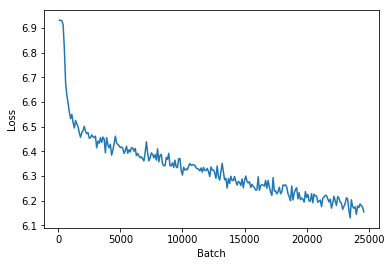

In [37]:
plt.plot(np.arange(100,24606,100), int_losses)
plt.xlabel('Batch')
plt.ylabel('Loss')

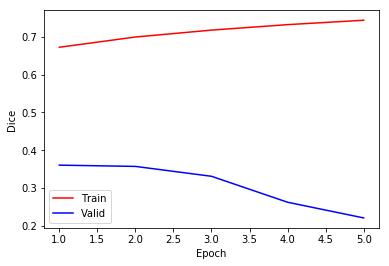

In [35]:
plt.plot(range(1,6), train_dices, color='red')
plt.plot(range(1,6), valid_dices, color='blue')
plt.legend(['Train', 'Valid'])
plt.xlabel('Epoch')
plt.ylabel('Dice')
plt.show()

In [56]:
dice_score, pred = test_model(test_dataloader, cnn)

100%|██████████| 365/365 [02:08<00:00,  2.85it/s]

299927
6615
2861.0


In [197]:
print(f"Final Test Result: {dice_score}")

Final Test Result: 0.388666283902369


In [114]:
input_transforms = transforms.Compose([transforms.ToTensor(),
            transforms.Normalize(mean=3.16,std=4.81)])
s_d = BrainsDataset3D(single_image, single_lesion, transform=input_transforms)
dl = DataLoader(s_d, batch_size=2000, shuffle=False)

In [115]:
dice_score, pred = test_model(dl, cnn)

100%|██████████| 352/352 [03:35<00:00,  1.63it/s]

343241
66644
40141.0


In [58]:
import nilearn

In [108]:
nib_lesions[225].shape

(176, 254, 160)

In [117]:
reshaped = pred.reshape(76,154,60)
padded = padding(reshaped, reshaped)[1]

In [191]:
vis = nilearn.image.new_img_like(nib_lesions[225], padded, affine=None, copy_header=False)

In [192]:
from nilearn import plotting

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/nilearn/reporting/html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



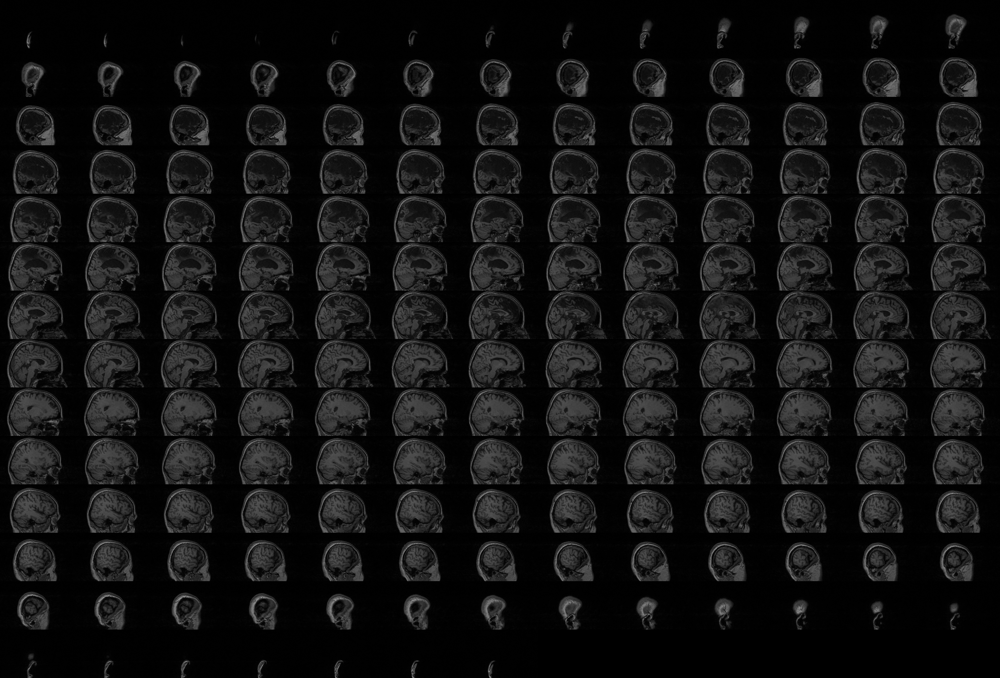
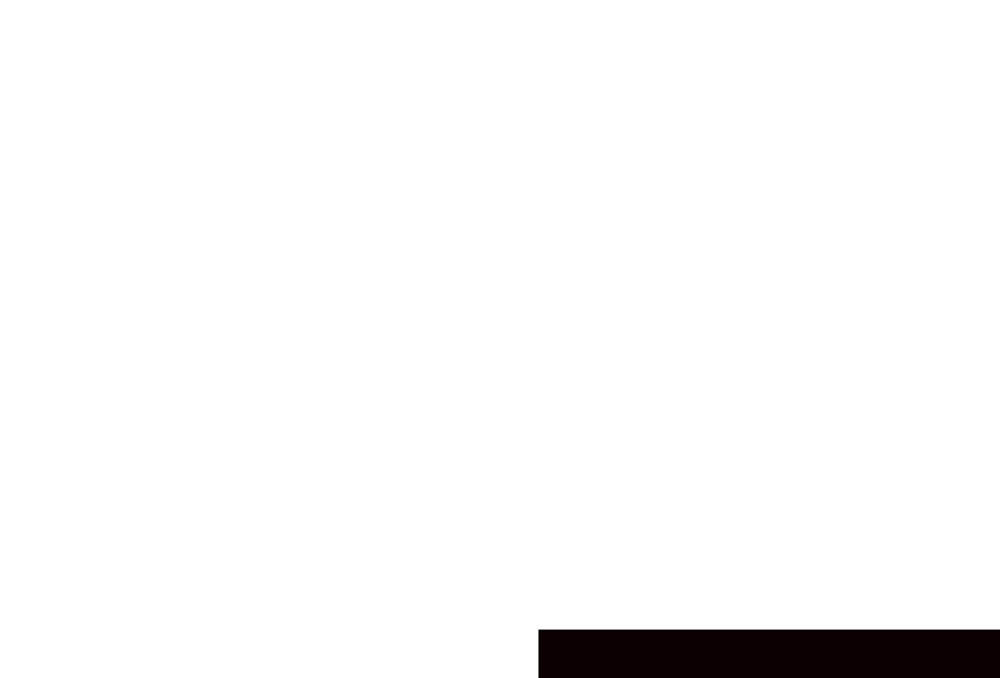

In [193]:
# plotting.view_img(vis,nib_images[225])


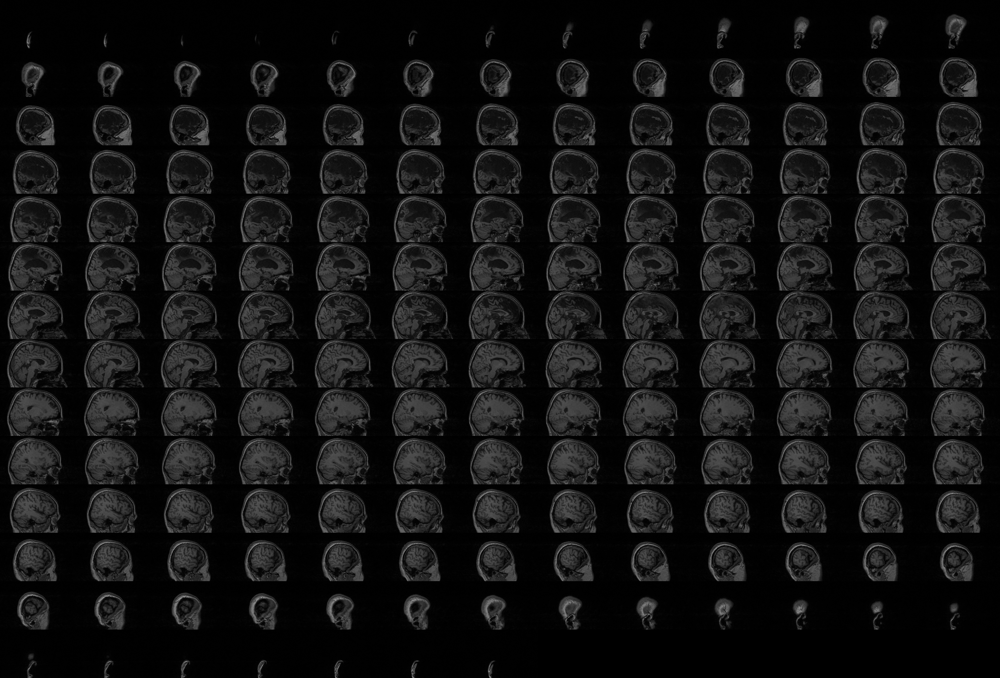
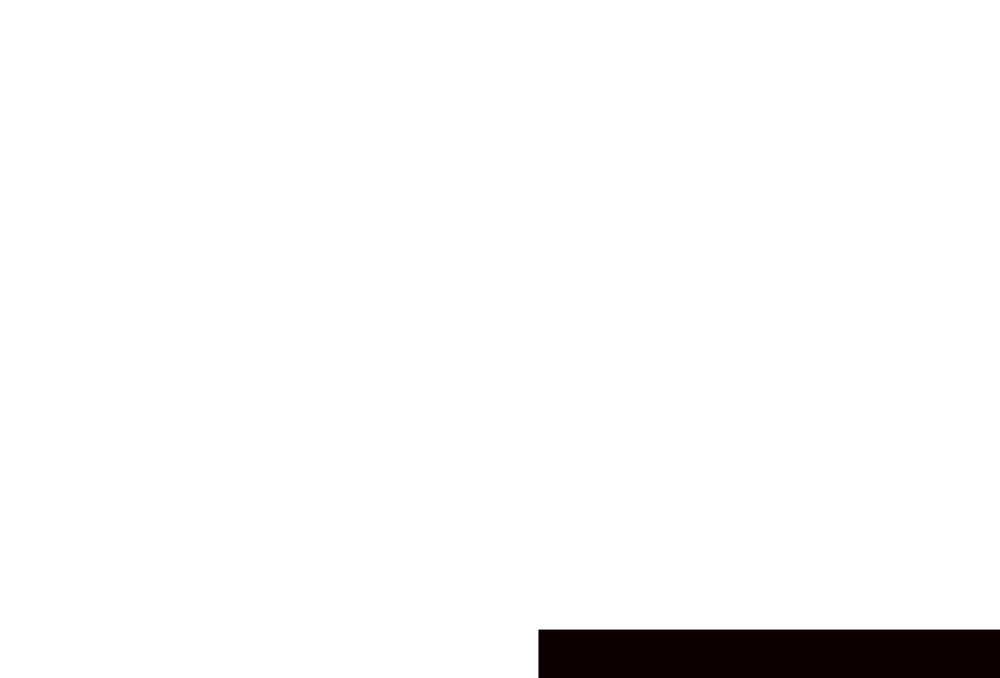

In [101]:
plotting.view_img(nib_lesions[225],nib_images[225])